# Stable Diffusion v1 (SDv1) の実装

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/py-img-gen/python-image-generation/blob/main/notebooks/4-4_stable-diffusion-v1.ipynb)

## 準備

In [1]:
!pip install -qq py-img-gen

In [2]:
import warnings

import torch

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
dtype = torch.float16
seed = 20

warnings.simplefilter("ignore", FutureWarning)

## 乱数の種の探索
- 参考: https://github.com/pcuenca/diffusers-examples/blob/main/notebooks/stable-diffusion-seeds.ipynb

### Stable Diffusion の読み込み

In [3]:
from diffusers import StableDiffusionPipeline

model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id, torch_dtype=dtype
)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### パラメータの設定

In [4]:
n_images = 4  # 生成する画像の枚数
width = height = 512  # 生成する画像の解像度
# 潜在表現のチャンネル数
in_channels = pipe.unet.config.in_channels

### 乱数の種を取得する関数

In [5]:
from typing import List


def get_latent_seeds(
    n_images: int, generator: torch.Generator
) -> List[int]:
    seeds = torch.randint(
        0, 2**32 - 1, size=(n_images,), generator=generator
    )
    return seeds.tolist()

### 潜在表現を取得する関数

In [6]:
from diffusers.utils.torch_utils import randn_tensor


def get_image_latent(
    in_channels: int,
    image_w: int,
    image_h: int,
    generator: torch.Generator,
    device: torch.device,
    dtype: torch.dtype,
) -> torch.Tensor:
    shape = (1, in_channels, image_h // 8, image_w // 8)
    return randn_tensor(
        shape, generator, device=device, dtype=dtype
    )

In [7]:
def get_image_latents(
    seeds: List[int],
    in_channels: int,
    device: torch.device,
    dtype: torch.dtype,
) -> torch.Tensor:
    latents = [
        get_image_latent(
            in_channels=in_channels,
            image_w=width,
            image_h=height,
            device=device,
            dtype=dtype,
            generator=torch.manual_seed(seed),
        )
        for seed in seeds
    ]
    return torch.cat(latents)

### 乱数の種の取得

In [8]:
seeds = get_latent_seeds(
    n_images=n_images, generator=torch.manual_seed(seed)
)
seeds

[2526002531, 3811404250, 3855651087, 4099169503]

### 乱数の種をもとにした潜在表現の取得

In [9]:
latents = get_image_latents(
    seeds=seeds,
    in_channels=in_channels,
    device=device,
    dtype=dtype,
)
latents.shape

torch.Size([4, 4, 64, 64])

## 取得した潜在表現を用いた画像生成

  0%|          | 0/50 [00:00<?, ?it/s]

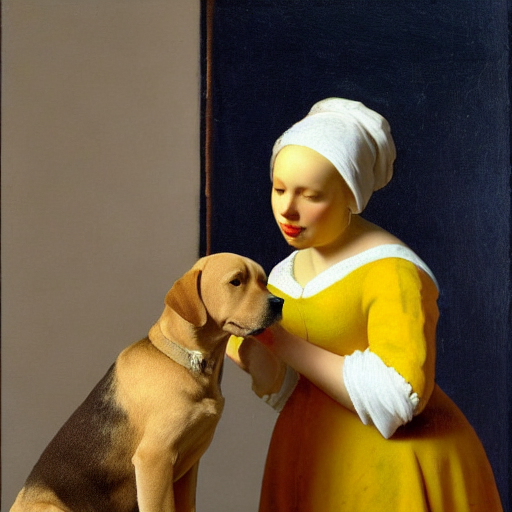

In [10]:
prompt = "Labrador in the style of Vermeer"

# プロンプトは潜在表現の数分設定する
prompts = [prompt] * n_images
# `latents` に取得した潜在表現を入力する
output = pipe(prompts, latents=latents)

images = output.images
images[0]

### 生成結果の確認

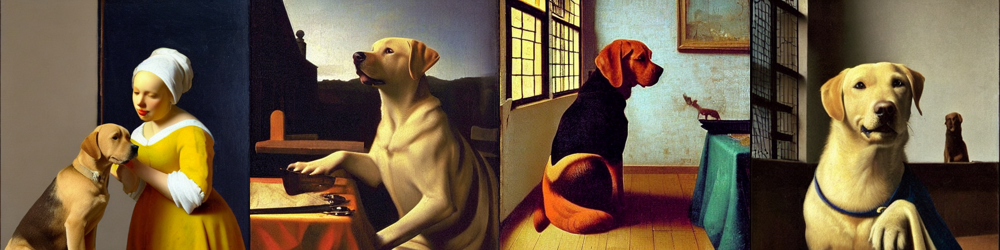

In [11]:
from diffusers.utils import make_image_grid

make_image_grid(images, rows=1, cols=len(images))

### 対象となる乱数の種の取得

In [12]:
my_seed = seeds[0]
my_seed

2526002531

### 乱数の種をもとにした潜在表現の取得

In [13]:
latent = get_image_latent(
    in_channels=in_channels,
    image_w=width,
    image_h=height,
    generator=torch.manual_seed(my_seed),
    device=device,
    dtype=dtype,
)
latent.shape

torch.Size([1, 4, 64, 64])

### 取得した潜在表現を用いた画像生成

  0%|          | 0/50 [00:00<?, ?it/s]

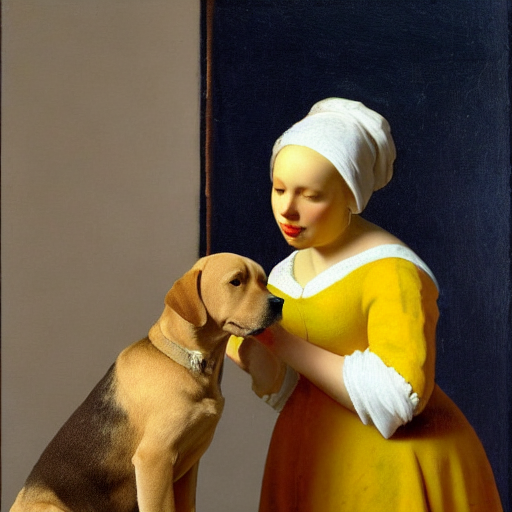

In [14]:
output = pipe(
    prompt="Labrador in the style of Vermeer",
    latents=latent,
)
images = output.images
images[0]

### 潜在表現を固定してプロンプトを変化させたときの画像生成

  0%|          | 0/50 [00:00<?, ?it/s]

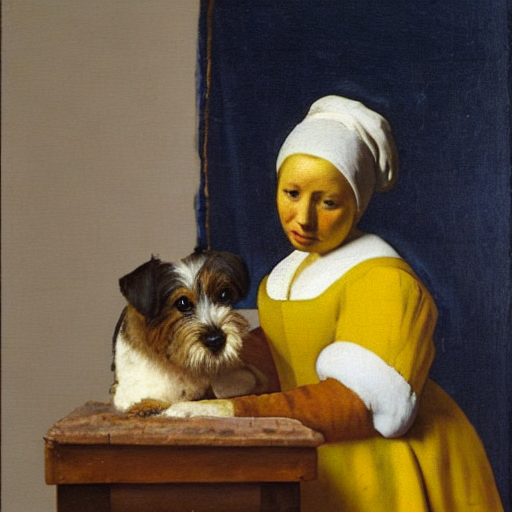

In [15]:
output = pipe(
    prompt="Terrier in the style of Vermeer", latents=latent
)
images = output.images
images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

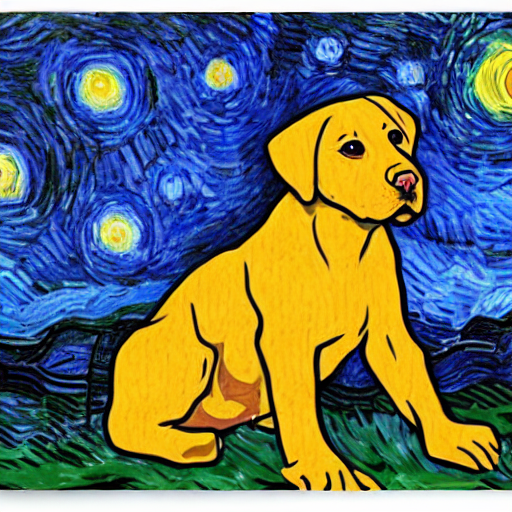

In [16]:
output = pipe(
    prompt="Labrador in the style of Van Gogh",
    latents=latent,
)
images = output.images
images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

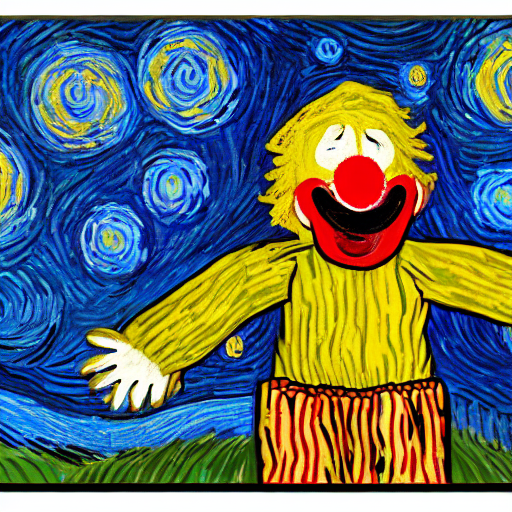

In [17]:
output = pipe(
    prompt="Clown in the style of Van Gogh", latents=latent
)
images = output.images
images[0]

## 画像からノイズを推定する Inversion 技術の実践
- 参考: https://huggingface.co/learn/diffusion-course/unit4/2

### Stable Diffusion の読み込み

In [18]:
from diffusers import StableDiffusionPipeline

model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id, torch_dtype=dtype
)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### DDIMScheduler の読み込み

In [19]:
from diffusers import DDIMScheduler

ddim_scheduler = DDIMScheduler.from_config(
    pipe.scheduler.config
)
pipe.scheduler = ddim_scheduler

### Stable Diffusion による画像生成

  0%|          | 0/50 [00:00<?, ?it/s]

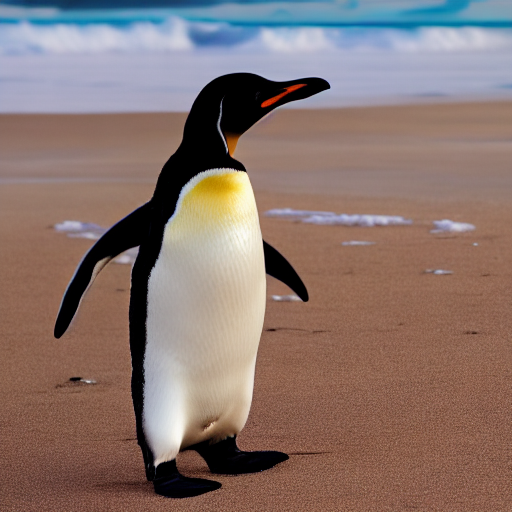

In [20]:
output = pipe(
    prompt="Beautiful DSLR Photograph of a penguin on the beach, golden hour",
    generator=torch.manual_seed(seed),
)
images = output.images
images[0]

### DDPM の $\alpha$ の可視化

Text(0, 0.5, '$\\alpha_t$')

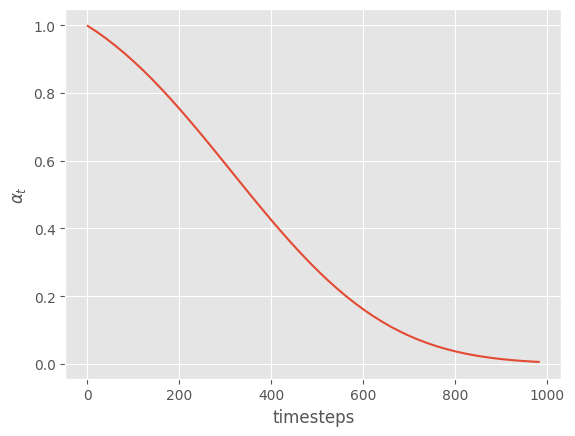

In [21]:
import matplotlib.pyplot as plt

plt.style.use("ggplot")

timesteps = pipe.scheduler.timesteps.cpu()
alphas = pipe.scheduler.alphas_cumprod[timesteps]

fig, ax = plt.subplots()
ax.plot(timesteps, alphas)
ax.set_xlabel("timesteps")
ax.set_ylabel(r"$\alpha_t$")

### DDIM による画像生成の実行関数の定義

In [22]:
from typing import List, Optional

from PIL.Image import Image as PilImage
from tqdm.auto import tqdm


def sample(
    prompt: str,
    start_step: int = 0,
    start_latents: Optional[torch.Tensor] = None,
    guidance_scale: float = 3.5,
    num_inference_steps: int = 50,
    num_images_per_prompt: int = 1,
    do_cfg: bool = True,
    generator: Optional[torch.Generator] = None,
) -> List[PilImage]:
    # プロンプトを埋め込みへ変換
    prompt_embeds = encode_prompt_embeds(
        prompt,
        device=device,
        num_images_per_prompt=num_images_per_prompt,
        do_cfg=do_cfg,
    )
    # 逆拡散過程におけるステップ数を設定
    pipe.scheduler.set_timesteps(
        num_inference_steps, device=device
    )
    # 潜在表現の準備 (未指定ならランダムに初期化)
    latents = prepare_latents(
        prompt_embeds=prompt_embeds,
        start_latents=start_latents,
        generator=generator,
    )
    # 逆拡散過程の実行
    for i in tqdm(range(start_step, num_inference_steps)):
        latents = reverse_diffusion_step(
            latents,
            prompt_embeds,
            t=pipe.scheduler.timesteps[i],
            guidance_scale=guidance_scale,
            do_cfg=do_cfg,
            num_inference_steps=num_inference_steps,
        )
    # 潜在表現を画像に復元
    return decode_latents_to_images(latents, generator)

### プロンプト埋め込みを取得する関数の定義

In [23]:
@torch.no_grad()
def encode_prompt_embeds(
    prompt: str,
    device: torch.device,
    num_images_per_prompt: int,
    do_cfg: bool,
) -> torch.Tensor:
    prompt_embeds, negative_prompt_embeds = (
        pipe.encode_prompt(
            prompt,
            device,
            num_images_per_prompt,
            do_cfg,
        )
    )
    if do_cfg:
        prompt_embeds = torch.cat(
            (negative_prompt_embeds, prompt_embeds)
        )
    return prompt_embeds

### 潜在表現を取得する関数およびCFG実行関数の定義

In [24]:
from typing import Optional


def prepare_latents(
    prompt_embeds: torch.Tensor,
    start_latents: Optional[torch.Tensor] = None,
    generator: Optional[torch.Generator] = None,
) -> torch.Tensor:
    # `start_latents` が指定されていない場合は、ランダムな初期値を生成
    if start_latents is None:
        start_latents = randn_tensor(
            (1, pipe.unet.config.in_channels, 64, 64),
            device=device,
            dtype=prompt_embeds.dtype,
            generator=generator,
        )
        return (
            start_latents * pipe.scheduler.init_noise_sigma
        )

    return start_latents.clone()


def apply_cfg(
    noise_pred: torch.Tensor, guidance_scale: float
) -> torch.Tensor:
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (
        noise_pred_text - noise_pred_uncond
    )
    return noise_pred

### 逆拡散過程の実行関数の定義

In [25]:
@torch.no_grad()
def reverse_diffusion_step(
    latents: torch.Tensor,
    prompt_embeds: torch.Tensor,
    t: torch.Tensor,
    guidance_scale: float,
    do_cfg: bool,
    num_inference_steps: int,
) -> torch.Tensor:
    # CFG のために latents を複製する
    latent_model_input = (
        torch.cat([latents] * 2) if do_cfg else latents
    )
    latent_model_input = pipe.scheduler.scale_model_input(
        latent_model_input, t
    )
    # UNetでノイズ推定
    noise_pred = pipe.unet(
        latent_model_input,
        t,
        encoder_hidden_states=prompt_embeds,
    ).sample

    # CFGによる誘導
    if do_cfg:
        noise_pred = apply_cfg(noise_pred, guidance_scale)

    # 通常は scheduler.step(noise_pred, t, latents) で
    # 計算するステップを今回は書き下してみる
    # t-1を計算し、alpha_t, alpha_(t-1)を取得
    prev_t = max(
        1, t.item() - (1000 // num_inference_steps)
    )
    alpha_t = pipe.scheduler.alphas_cumprod[t.item()]
    alpha_t_prev = pipe.scheduler.alphas_cumprod[prev_t]

    predicted_x0 = (
        latents - (1 - alpha_t).sqrt() * noise_pred
    ) / alpha_t.sqrt()
    direction_pointing_to_xt = (
        1 - alpha_t_prev
    ).sqrt() * noise_pred

    latents = (
        alpha_t_prev.sqrt() * predicted_x0
        + direction_pointing_to_xt
    )
    return latents

### 潜在表現から画像への変換関数の定義

In [26]:
@torch.no_grad()
def decode_latents_to_images(
    latents: torch.Tensor,
    generator: Optional[torch.Generator] = None,
) -> List[PilImage]:
    images = pipe.vae.decode(
        latents / pipe.vae.scaling_factor,
        generator=generator,
    ).sample
    images = pipe.image_processor.postprocess(
        images, do_denormalize=[True] * images.shape[0]
    )
    return images

### DDIM による画像生成の実行

  0%|          | 0/50 [00:00<?, ?it/s]

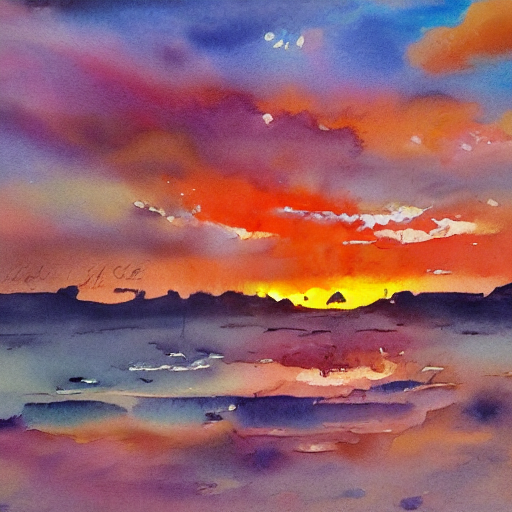

In [27]:
images = sample(
    prompt="Watercolor painting of a beach sunset",
    num_inference_steps=50,
    generator=torch.manual_seed(seed),
)
images[0]

### サンプル画像の準備

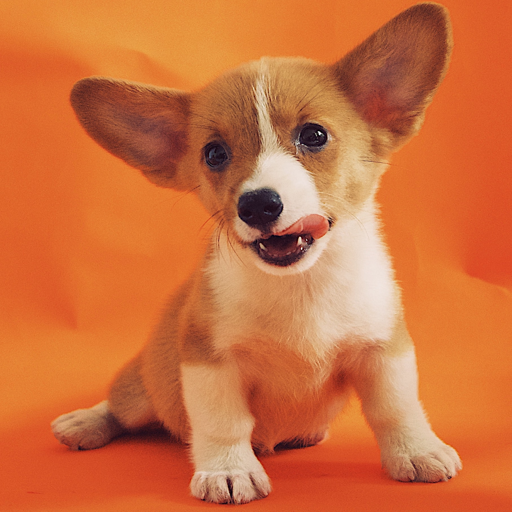

In [28]:
from diffusers.utils import load_image

input_image = load_image(
    "https://huggingface.co/datasets/diffusers/dog-example/resolve/main/alvan-nee-9M0tSjb-cpA-unsplash.jpeg",
)
input_image = input_image.resize((width, height))
input_image

### 初期プロンプトの指定

In [29]:
input_image_prompt = "A professional photo of a dog sitting on an orange background"

### 画像の潜在表現へのエンコード

In [30]:
from torchvision.transforms import functional as F

image_tensor = F.to_tensor(input_image)
# shape: (3, 512, 512)
image_tensor = image_tensor.unsqueeze(dim=0)
# shape: (1, 3, 512, 512)
image_tensor = image_tensor.to(device=device, dtype=dtype)

vae_scaling_factor = pipe.vae.scaling_factor
with torch.no_grad():
    latent = pipe.vae.encode(image_tensor * 2 - 1)
# l = pipe.vae.config.scaling_factor * latent.latent_dist.sample()
latent = vae_scaling_factor * latent.latent_dist.sample()

### Inversion 実行関数の定義

In [31]:
def invert(
    prompt: str,
    start_latents: torch.Tensor,
    guidance_scale: float = 3.5,
    num_inference_steps: int = 50,
    num_images_per_prompt: int = 1,
    do_cfg: bool = True,
) -> torch.Tensor:
    # プロンプトを埋め込みへ変換
    prompt_embeds = encode_prompt_embeds(
        prompt,
        device=device,
        num_images_per_prompt=num_images_per_prompt,
        do_cfg=do_cfg,
    )

    # 初期状態の潜在表現をコピー
    latents = start_latents.clone()

    # invert 実行時の中間的な潜在表現を格納するリストを用意
    intermediate_latents = []

    # ノイズスケジューラにステップ数を設定し、timesteps を反転
    pipe.scheduler.set_timesteps(
        num_inference_steps, device=device
    )
    timesteps = list(reversed(pipe.scheduler.timesteps))

    for i in tqdm(
        range(1, num_inference_steps),
        total=num_inference_steps - 1,
    ):
        if i >= num_inference_steps - 1:
            continue  # ループの最後のステップは飛ばす設定

        latents = invert_step(
            latents,
            prompt_embeds,
            t=timesteps[i],
            guidance_scale=guidance_scale,
            do_cfg=do_cfg,
            num_inference_steps=num_inference_steps,
        )
        # 中間結果を保存
        intermediate_latents.append(latents)

    # 中間結果を結合して返す
    return torch.cat(intermediate_latents)

### 1 ステップの Inversion を実行する関数の定義

In [32]:
@torch.no_grad()
def invert_step(
    latents: torch.Tensor,
    prompt_embeds: torch.Tensor,
    t: torch.Tensor,
    guidance_scale: float,
    do_cfg: bool,
    num_inference_steps: int,
) -> torch.Tensor:
    # CFG のために latents を複製する
    latent_model_input = (
        torch.cat([latents] * 2) if do_cfg else latents
    )
    latent_model_input = pipe.scheduler.scale_model_input(
        latent_model_input, t
    )
    # UNetでノイズ推定
    noise_pred = pipe.unet(
        latent_model_input,
        t,
        encoder_hidden_states=prompt_embeds,
    ).sample

    # CFGによる誘導
    if do_cfg:
        noise_pred = apply_cfg(noise_pred, guidance_scale)

    # scheduler の計算とは逆向きの手動ステップ (DDIM の式を再配置)
    # 現在時刻 t の一つ前を current_t、次を next_t として計算
    current_t = max(
        0, t.item() - (1000 // num_inference_steps)
    )
    next_t = t  # min(999, t.item() + (1000//num_inference_steps)) # t+1
    alpha_t = pipe.scheduler.alphas_cumprod[current_t]
    alpha_t_next = pipe.scheduler.alphas_cumprod[next_t]

    # x(t) を使って x(t-1) を求める逆向きステップ (論文の式を再配置)
    latents = (
        latents - (1 - alpha_t).sqrt() * noise_pred
    ) * (alpha_t_next.sqrt() / alpha_t.sqrt()) + (
        1 - alpha_t_next
    ).sqrt() * noise_pred

    return latents

### Inversion の実行

In [33]:
inverted_latents = invert(
    prompt=input_image_prompt,
    start_latents=latent,
    num_inference_steps=50,
)
inverted_latents.shape

  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([48, 4, 64, 64])

### Inversion 結果の確認

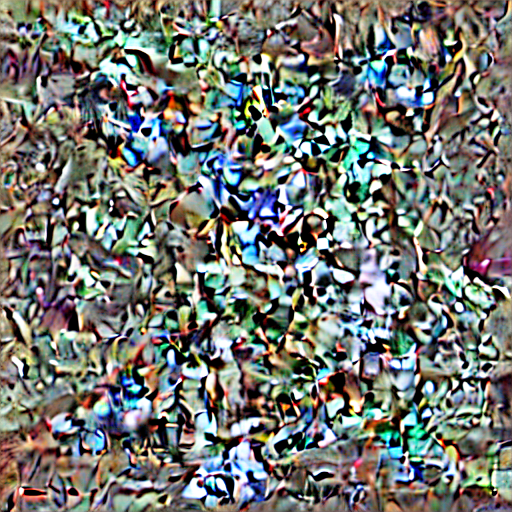

In [34]:
inverted_latent = inverted_latents[-1].unsqueeze(dim=0)
inverted_latent = inverted_latent / vae_scaling_factor

with torch.no_grad():
    images = pipe.vae.decode(inverted_latent).sample

images = pipe.image_processor.postprocess(
    images, do_denormalize=[True] * images.shape[0]
)
images[0]

### Inversion 結果をもとにした画像の生成

  0%|          | 0/50 [00:00<?, ?it/s]

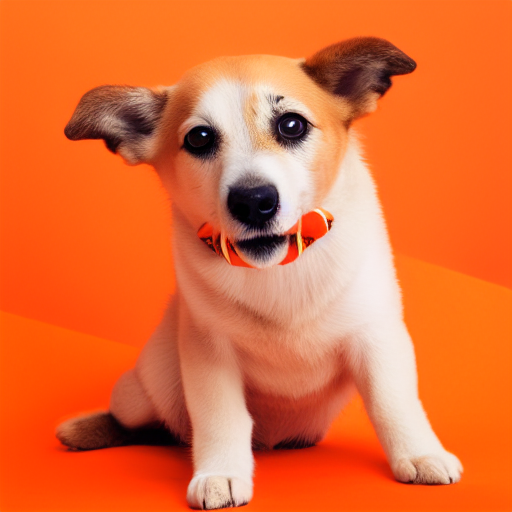

In [35]:
output = pipe(
    prompt=input_image_prompt,
    latents=inverted_latents[-1].unsqueeze(dim=0),
    num_inference_steps=50,
    generator=torch.manual_seed(seed),
)
images = output.images
images[0]

  0%|          | 0/30 [00:00<?, ?it/s]

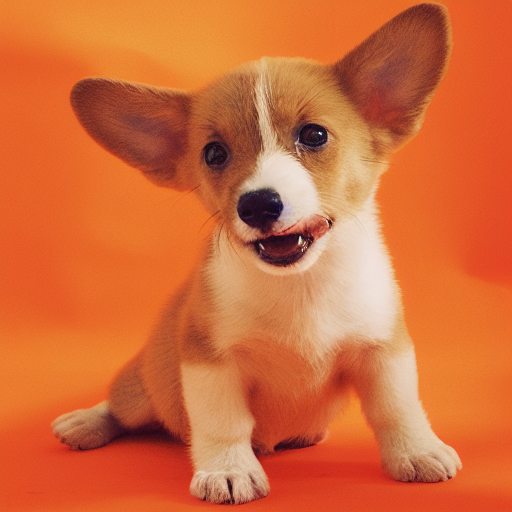

In [36]:
start_step = 20
inverted_latent = inverted_latents[-(start_step + 1)]
inverted_latent = inverted_latent.unsqueeze(dim=0)

images = sample(
    prompt=input_image_prompt,
    start_latents=inverted_latent,
    start_step=start_step,
    num_inference_steps=50,
    generator=torch.manual_seed(seed),
)
images[0]

Before: A professional photo of a dog sitting on an orange background
After:  A professional photo of a cat sitting on an orange background


  0%|          | 0/40 [00:00<?, ?it/s]

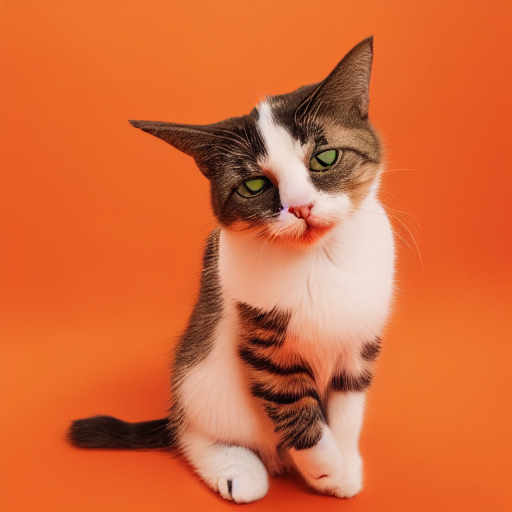

In [37]:
start_step = 10
inverted_latent = inverted_latents[-(start_step + 1)]
inverted_latent = inverted_latent.unsqueeze(dim=0)

new_prompt = input_image_prompt.replace("dog", "cat")
print(f"Before: {input_image_prompt}")
print(f"After:  {new_prompt}")

images = sample(
    prompt=new_prompt,
    start_step=start_step,
    start_latents=inverted_latent,
    num_inference_steps=50,
    guidance_scale=8.0,
    generator=torch.manual_seed(seed),
)
images[0]